In [1]:
%matplotlib inline

import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

from config import cfg_seed, cfg_env, cfg_z_dim, cfg_default_lr, cfg_default_early
seed = cfg_seed
env_str=cfg_env
default_lr=cfg_default_lr
default_early=cfg_default_early

from config import cfg_alpha
alpha=cfg_alpha

num_iter_max=200000

env_name = 'CustomPendulum-v0'
figfilenamehead = "fig_policy_evaluation_"+env_str+"_"

loss_list = []
normalized_loss_list = []

print("alpha",alpha)
print(datetime.datetime.now())

alpha 0.3
2023-06-06 12:45:18.894023


In [2]:
import gym
import custom_gym
env = gym.make(env_name)

random.seed(seed)
np.random.seed(seed)

env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)


s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = cfg_z_dim
print(s_dim, a_dim, z_dim)



2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
agent = SAC(env.observation_space.shape[0], env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_mdp_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_mdp_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":agent.policy.my_np_select_action,
    "bamdp_policy":None,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str,
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base(ckpt_key="unweighted") # 重みなし学習結果だけをロード

dec: h_dim 16
base load ckpt ckpt_basevi_pendulum_unweighted
base load self.initial_belief.data.sum() tensor(-6.8937)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(1.0739)
penalty_target_min tensor(-5.8382) penalty_target_max tensor(21.6424)
train_loss:  -4.010319100385905
valid_loss:  -4.853664096069337
h_min_tilde -5.838158 ell_tilde -4.178988099522591 kappa_tilde 0.000776344628850762


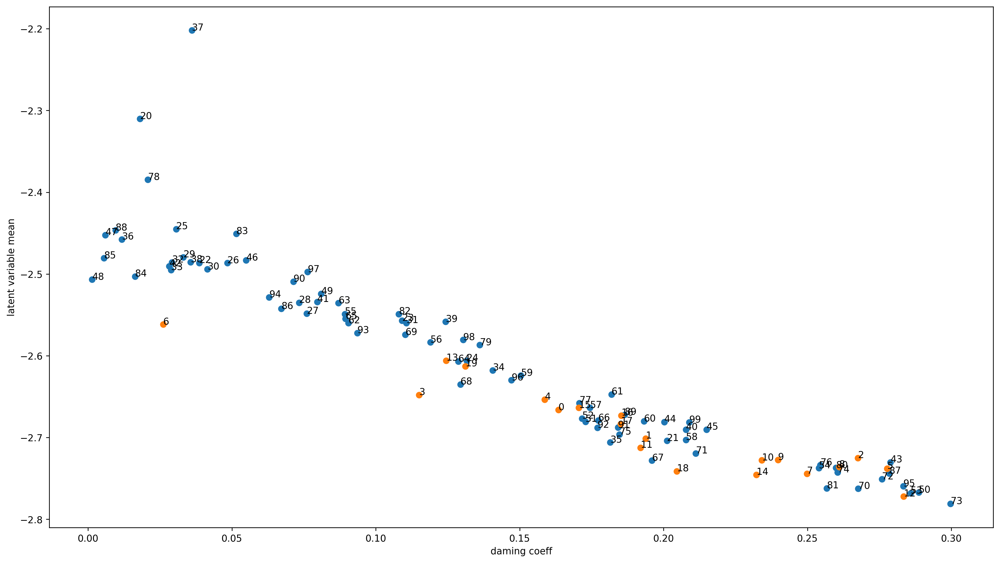

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_iter0.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter0.pdf")
plt.show()

for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_mdppolicy_data()

0  1  2  3  4  

/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observ

5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [7]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


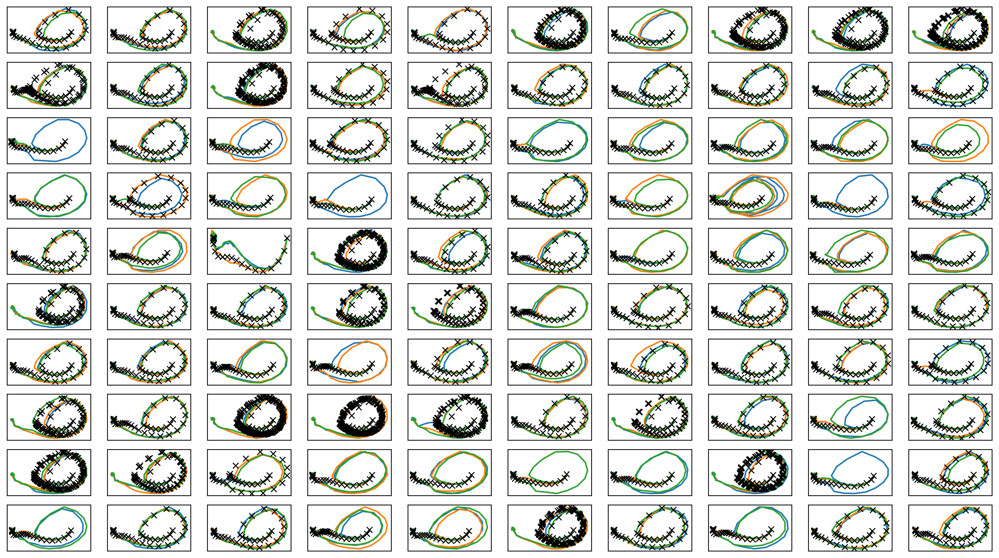

In [8]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter0.png")
plt.savefig(figfilenamehead+"joint_iter0.eps")
# plt.savefig(figfilenamehead+"joint_iter0.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-06-06 12:45:49.712076


# Iter 1

In [10]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 1.13500  validloss 1.42324±0.00000  bestvalidloss 1.42324  last_update 0
train: iter 1  trainloss 0.71010  validloss 0.78291±0.00000  bestvalidloss 0.78291  last_update 0
train: iter 2  trainloss 0.63605  validloss 0.60112±0.00000  bestvalidloss 0.60112  last_update 0
train: iter 3  trainloss 0.60405  validloss 0.55012±0.00000  bestvalidloss 0.55012  last_update 0
train: iter 4  trainloss 0.57825  validloss 0.51406±0.00000  bestvalidloss 0.51406  last_update 0
train: iter 5  trainloss 0.55449  validloss 0.48293±0.00000  bestvalidloss 0.48293  last_update 0
train: iter 6  trainloss 0.53076  validloss 0.45425±0.00000  bestvalidloss 0.45425  last_update 0
train: iter 7  trainloss 0.50686  validloss 0.43163±0.00000  bestvalidloss 0.43163  last_update 0
train: iter 8  trainloss 0.48282  validloss 0.40442±0.00000  bestvalidloss 0.40442  last_update 0
train: iter 9  trainloss 0.46256  validloss 0.38495±0.00000  bestvalidloss 0.38495  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.20470  validloss 0.18980±0.00000  bestvalidloss 0.18435  last_update 9
train: iter 84  trainloss 0.20325  validloss 0.18469±0.00000  bestvalidloss 0.18435  last_update 10
train: iter 85  trainloss 0.20471  validloss 0.18724±0.00000  bestvalidloss 0.18435  last_update 11
train: iter 86  trainloss 0.20730  validloss 0.20770±0.00000  bestvalidloss 0.18435  last_update 12
train: iter 87  trainloss 0.20214  validloss 0.18483±0.00000  bestvalidloss 0.18435  last_update 13
train: iter 88  trainloss 0.20689  validloss 0.18492±0.00000  bestvalidloss 0.18435  last_update 14
train: iter 89  trainloss 0.20080  validloss 0.18180±0.00000  bestvalidloss 0.18180  last_update 0
train: iter 90  trainloss 0.20180  validloss 0.18809±0.00000  bestvalidloss 0.18180  last_update 1
train: iter 91  trainloss 0.20245  validloss 0.18122±0.00000  bestvalidloss 0.18122  last_update 0
train: iter 92  trainloss 0.20695  validloss 0.17912±0.00000  bestvalidloss 0.17912  last_update 0
train

train: iter 166  trainloss 0.18789  validloss 0.16575±0.00000  bestvalidloss 0.16575  last_update 0
train: iter 167  trainloss 0.18687  validloss 0.16873±0.00000  bestvalidloss 0.16575  last_update 1
train: iter 168  trainloss 0.18975  validloss 0.16411±0.00000  bestvalidloss 0.16411  last_update 0
train: iter 169  trainloss 0.18959  validloss 0.18135±0.00000  bestvalidloss 0.16411  last_update 1
train: iter 170  trainloss 0.18509  validloss 0.16740±0.00000  bestvalidloss 0.16411  last_update 2
train: iter 171  trainloss 0.18356  validloss 0.16692±0.00000  bestvalidloss 0.16411  last_update 3
train: iter 172  trainloss 0.18610  validloss 0.17299±0.00000  bestvalidloss 0.16411  last_update 4
train: iter 173  trainloss 0.18713  validloss 0.16573±0.00000  bestvalidloss 0.16411  last_update 5
train: iter 174  trainloss 0.18479  validloss 0.16969±0.00000  bestvalidloss 0.16411  last_update 6
train: iter 175  trainloss 0.18329  validloss 0.16954±0.00000  bestvalidloss 0.16411  last_update 7


train: iter 248  trainloss 0.18051  validloss 0.16274±0.00000  bestvalidloss 0.15633  last_update 11
train: iter 249  trainloss 0.17540  validloss 0.15661±0.00000  bestvalidloss 0.15633  last_update 12
train: iter 250  trainloss 0.17665  validloss 0.17019±0.00000  bestvalidloss 0.15633  last_update 13
train: iter 251  trainloss 0.17586  validloss 0.16021±0.00000  bestvalidloss 0.15633  last_update 14
train: iter 252  trainloss 0.17608  validloss 0.15683±0.00000  bestvalidloss 0.15633  last_update 15
train: iter 253  trainloss 0.17687  validloss 0.15962±0.00000  bestvalidloss 0.15633  last_update 16
train: iter 254  trainloss 0.17988  validloss 0.15759±0.00000  bestvalidloss 0.15633  last_update 17
train: iter 255  trainloss 0.17832  validloss 0.15700±0.00000  bestvalidloss 0.15633  last_update 18
train: iter 256  trainloss 0.17753  validloss 0.16663±0.00000  bestvalidloss 0.15633  last_update 19
train: iter 257  trainloss 0.17418  validloss 0.15858±0.00000  bestvalidloss 0.15633  last_

train: iter 330  trainloss 0.17030  validloss 0.15011±0.00000  bestvalidloss 0.14892  last_update 11
train: iter 331  trainloss 0.16829  validloss 0.15041±0.00000  bestvalidloss 0.14892  last_update 12
train: iter 332  trainloss 0.17079  validloss 0.15245±0.00000  bestvalidloss 0.14892  last_update 13
train: iter 333  trainloss 0.16976  validloss 0.15406±0.00000  bestvalidloss 0.14892  last_update 14
train: iter 334  trainloss 0.16893  validloss 0.15189±0.00000  bestvalidloss 0.14892  last_update 15
train: iter 335  trainloss 0.17382  validloss 0.16272±0.00000  bestvalidloss 0.14892  last_update 16
train: iter 336  trainloss 0.17093  validloss 0.15010±0.00000  bestvalidloss 0.14892  last_update 17
train: iter 337  trainloss 0.17381  validloss 0.15188±0.00000  bestvalidloss 0.14892  last_update 18
train: iter 338  trainloss 0.16896  validloss 0.15130±0.00000  bestvalidloss 0.14892  last_update 19
train: iter 339  trainloss 0.17218  validloss 0.14830±0.00000  bestvalidloss 0.14830  last_

train: iter 412  trainloss 0.16565  validloss 0.15334±0.00000  bestvalidloss 0.14266  last_update 2
train: iter 413  trainloss 0.16845  validloss 0.15192±0.00000  bestvalidloss 0.14266  last_update 3
train: iter 414  trainloss 0.16901  validloss 0.14468±0.00000  bestvalidloss 0.14266  last_update 4
train: iter 415  trainloss 0.16679  validloss 0.14772±0.00000  bestvalidloss 0.14266  last_update 5
train: iter 416  trainloss 0.16726  validloss 0.15263±0.00000  bestvalidloss 0.14266  last_update 6
train: iter 417  trainloss 0.16583  validloss 0.14448±0.00000  bestvalidloss 0.14266  last_update 7
train: iter 418  trainloss 0.16516  validloss 0.15354±0.00000  bestvalidloss 0.14266  last_update 8
train: iter 419  trainloss 0.16350  validloss 0.14770±0.00000  bestvalidloss 0.14266  last_update 9
train: iter 420  trainloss 0.16367  validloss 0.14669±0.00000  bestvalidloss 0.14266  last_update 10
train: iter 421  trainloss 0.16336  validloss 0.14431±0.00000  bestvalidloss 0.14266  last_update 1

train: iter 494  trainloss 0.16125  validloss 0.15437±0.00000  bestvalidloss 0.13862  last_update 18
train: iter 495  trainloss 0.16097  validloss 0.14983±0.00000  bestvalidloss 0.13862  last_update 19
train: iter 496  trainloss 0.16080  validloss 0.14190±0.00000  bestvalidloss 0.13862  last_update 20
train: iter 497  trainloss 0.15918  validloss 0.14062±0.00000  bestvalidloss 0.13862  last_update 21
train: iter 498  trainloss 0.16451  validloss 0.15037±0.00000  bestvalidloss 0.13862  last_update 22
train: iter 499  trainloss 0.16392  validloss 0.15478±0.00000  bestvalidloss 0.13862  last_update 23
train: iter 500  trainloss 0.16032  validloss 0.14493±0.00000  bestvalidloss 0.13862  last_update 24
train: iter 501  trainloss 0.16077  validloss 0.14396±0.00000  bestvalidloss 0.13862  last_update 25
train: iter 502  trainloss 0.16073  validloss 0.14240±0.00000  bestvalidloss 0.13862  last_update 26
train: iter 503  trainloss 0.16144  validloss 0.14278±0.00000  bestvalidloss 0.13862  last_

train: iter 576  trainloss 0.15990  validloss 0.14314±0.00000  bestvalidloss 0.13739  last_update 6
train: iter 577  trainloss 0.15878  validloss 0.13996±0.00000  bestvalidloss 0.13739  last_update 7
train: iter 578  trainloss 0.15878  validloss 0.14023±0.00000  bestvalidloss 0.13739  last_update 8
train: iter 579  trainloss 0.15825  validloss 0.13895±0.00000  bestvalidloss 0.13739  last_update 9
train: iter 580  trainloss 0.15698  validloss 0.13960±0.00000  bestvalidloss 0.13739  last_update 10
train: iter 581  trainloss 0.16070  validloss 0.14219±0.00000  bestvalidloss 0.13739  last_update 11
train: iter 582  trainloss 0.16417  validloss 0.14572±0.00000  bestvalidloss 0.13739  last_update 12
train: iter 583  trainloss 0.15735  validloss 0.14029±0.00000  bestvalidloss 0.13739  last_update 13
train: iter 584  trainloss 0.15800  validloss 0.13851±0.00000  bestvalidloss 0.13739  last_update 14
train: iter 585  trainloss 0.15959  validloss 0.14699±0.00000  bestvalidloss 0.13739  last_upda

train: iter 658  trainloss 0.15750  validloss 0.15105±0.00000  bestvalidloss 0.13487  last_update 56
train: iter 659  trainloss 0.15742  validloss 0.13782±0.00000  bestvalidloss 0.13487  last_update 57
train: iter 660  trainloss 0.15950  validloss 0.14251±0.00000  bestvalidloss 0.13487  last_update 58
train: iter 661  trainloss 0.15559  validloss 0.13683±0.00000  bestvalidloss 0.13487  last_update 59
train: iter 662  trainloss 0.15733  validloss 0.13555±0.00000  bestvalidloss 0.13487  last_update 60
train: iter 663  trainloss 0.15748  validloss 0.13645±0.00000  bestvalidloss 0.13487  last_update 61
train: iter 664  trainloss 0.15806  validloss 0.13517±0.00000  bestvalidloss 0.13487  last_update 62
train: iter 665  trainloss 0.15850  validloss 0.14082±0.00000  bestvalidloss 0.13487  last_update 63
train: iter 666  trainloss 0.15602  validloss 0.14871±0.00000  bestvalidloss 0.13487  last_update 64
train: iter 667  trainloss 0.15664  validloss 0.13875±0.00000  bestvalidloss 0.13487  last_

train: iter 740  trainloss 0.15499  validloss 0.14507±0.00000  bestvalidloss 0.13297  last_update 26
train: iter 741  trainloss 0.15575  validloss 0.13450±0.00000  bestvalidloss 0.13297  last_update 27
train: iter 742  trainloss 0.15367  validloss 0.13734±0.00000  bestvalidloss 0.13297  last_update 28
train: iter 743  trainloss 0.15305  validloss 0.13407±0.00000  bestvalidloss 0.13297  last_update 29
train: iter 744  trainloss 0.15392  validloss 0.13443±0.00000  bestvalidloss 0.13297  last_update 30
train: iter 745  trainloss 0.15557  validloss 0.13372±0.00000  bestvalidloss 0.13297  last_update 31
train: iter 746  trainloss 0.15585  validloss 0.14806±0.00000  bestvalidloss 0.13297  last_update 32
train: iter 747  trainloss 0.15167  validloss 0.13500±0.00000  bestvalidloss 0.13297  last_update 33
train: iter 748  trainloss 0.15897  validloss 0.13569±0.00000  bestvalidloss 0.13297  last_update 34
train: iter 749  trainloss 0.15500  validloss 0.13472±0.00000  bestvalidloss 0.13297  last_

train: iter 823  trainloss 0.15173  validloss 0.13572±0.00000  bestvalidloss 0.13089  last_update 62
train: iter 824  trainloss 0.15158  validloss 0.13385±0.00000  bestvalidloss 0.13089  last_update 63
train: iter 825  trainloss 0.15427  validloss 0.15205±0.00000  bestvalidloss 0.13089  last_update 64
train: iter 826  trainloss 0.15152  validloss 0.13477±0.00000  bestvalidloss 0.13089  last_update 65
train: iter 827  trainloss 0.15115  validloss 0.13459±0.00000  bestvalidloss 0.13089  last_update 66
train: iter 828  trainloss 0.15128  validloss 0.14263±0.00000  bestvalidloss 0.13089  last_update 67
train: iter 829  trainloss 0.15284  validloss 0.13737±0.00000  bestvalidloss 0.13089  last_update 68
train: iter 830  trainloss 0.15166  validloss 0.13370±0.00000  bestvalidloss 0.13089  last_update 69
train: iter 831  trainloss 0.15228  validloss 0.13421±0.00000  bestvalidloss 0.13089  last_update 70
train: iter 832  trainloss 0.15123  validloss 0.14126±0.00000  bestvalidloss 0.13089  last_

train: iter 905  trainloss 0.14908  validloss 0.13418±0.00000  bestvalidloss 0.12996  last_update 22
train: iter 906  trainloss 0.14975  validloss 0.13029±0.00000  bestvalidloss 0.12996  last_update 23
train: iter 907  trainloss 0.15383  validloss 0.13488±0.00000  bestvalidloss 0.12996  last_update 24
train: iter 908  trainloss 0.15235  validloss 0.13114±0.00000  bestvalidloss 0.12996  last_update 25
train: iter 909  trainloss 0.15377  validloss 0.13454±0.00000  bestvalidloss 0.12996  last_update 26
train: iter 910  trainloss 0.15299  validloss 0.13114±0.00000  bestvalidloss 0.12996  last_update 27
train: iter 911  trainloss 0.15294  validloss 0.13196±0.00000  bestvalidloss 0.12996  last_update 28
train: iter 912  trainloss 0.14974  validloss 0.13316±0.00000  bestvalidloss 0.12996  last_update 29
train: iter 913  trainloss 0.15172  validloss 0.13522±0.00000  bestvalidloss 0.12996  last_update 30
train: iter 914  trainloss 0.15053  validloss 0.13055±0.00000  bestvalidloss 0.12996  last_

train: iter 987  trainloss 0.14975  validloss 0.13130±0.00000  bestvalidloss 0.12819  last_update 1
train: iter 988  trainloss 0.15104  validloss 0.13013±0.00000  bestvalidloss 0.12819  last_update 2
train: iter 989  trainloss 0.14926  validloss 0.13182±0.00000  bestvalidloss 0.12819  last_update 3
train: iter 990  trainloss 0.15348  validloss 0.13218±0.00000  bestvalidloss 0.12819  last_update 4
train: iter 991  trainloss 0.14817  validloss 0.13526±0.00000  bestvalidloss 0.12819  last_update 5
train: iter 992  trainloss 0.14901  validloss 0.12956±0.00000  bestvalidloss 0.12819  last_update 6
train: iter 993  trainloss 0.14928  validloss 0.13546±0.00000  bestvalidloss 0.12819  last_update 7
train: iter 994  trainloss 0.14883  validloss 0.13515±0.00000  bestvalidloss 0.12819  last_update 8
train: iter 995  trainloss 0.14856  validloss 0.13106±0.00000  bestvalidloss 0.12819  last_update 9
train: iter 996  trainloss 0.14983  validloss 0.13600±0.00000  bestvalidloss 0.12819  last_update 10

train: iter 1068  trainloss 0.14646  validloss 0.12795±0.00000  bestvalidloss 0.12634  last_update 13
train: iter 1069  trainloss 0.14627  validloss 0.12891±0.00000  bestvalidloss 0.12634  last_update 14
train: iter 1070  trainloss 0.14914  validloss 0.12948±0.00000  bestvalidloss 0.12634  last_update 15
train: iter 1071  trainloss 0.14748  validloss 0.12747±0.00000  bestvalidloss 0.12634  last_update 16
train: iter 1072  trainloss 0.14976  validloss 0.12891±0.00000  bestvalidloss 0.12634  last_update 17
train: iter 1073  trainloss 0.14745  validloss 0.12952±0.00000  bestvalidloss 0.12634  last_update 18
train: iter 1074  trainloss 0.14658  validloss 0.12985±0.00000  bestvalidloss 0.12634  last_update 19
train: iter 1075  trainloss 0.15192  validloss 0.12919±0.00000  bestvalidloss 0.12634  last_update 20
train: iter 1076  trainloss 0.14887  validloss 0.13090±0.00000  bestvalidloss 0.12634  last_update 21
train: iter 1077  trainloss 0.14620  validloss 0.12893±0.00000  bestvalidloss 0.12

train: iter 1149  trainloss 0.14505  validloss 0.12699±0.00000  bestvalidloss 0.12477  last_update 5
train: iter 1150  trainloss 0.15172  validloss 0.13812±0.00000  bestvalidloss 0.12477  last_update 6
train: iter 1151  trainloss 0.14574  validloss 0.12711±0.00000  bestvalidloss 0.12477  last_update 7
train: iter 1152  trainloss 0.14526  validloss 0.12600±0.00000  bestvalidloss 0.12477  last_update 8
train: iter 1153  trainloss 0.14671  validloss 0.12978±0.00000  bestvalidloss 0.12477  last_update 9
train: iter 1154  trainloss 0.14691  validloss 0.12474±0.00000  bestvalidloss 0.12474  last_update 0
train: iter 1155  trainloss 0.15345  validloss 0.12651±0.00000  bestvalidloss 0.12474  last_update 1
train: iter 1156  trainloss 0.14660  validloss 0.12517±0.00000  bestvalidloss 0.12474  last_update 2
train: iter 1157  trainloss 0.14556  validloss 0.12585±0.00000  bestvalidloss 0.12474  last_update 3
train: iter 1158  trainloss 0.14601  validloss 0.13084±0.00000  bestvalidloss 0.12474  last

train: iter 1230  trainloss 0.14515  validloss 0.12731±0.00000  bestvalidloss 0.12428  last_update 43
train: iter 1231  trainloss 0.14770  validloss 0.12585±0.00000  bestvalidloss 0.12428  last_update 44
train: iter 1232  trainloss 0.14537  validloss 0.12716±0.00000  bestvalidloss 0.12428  last_update 45
train: iter 1233  trainloss 0.14551  validloss 0.12462±0.00000  bestvalidloss 0.12428  last_update 46
train: iter 1234  trainloss 0.14421  validloss 0.12668±0.00000  bestvalidloss 0.12428  last_update 47
train: iter 1235  trainloss 0.14612  validloss 0.12855±0.00000  bestvalidloss 0.12428  last_update 48
train: iter 1236  trainloss 0.14492  validloss 0.12538±0.00000  bestvalidloss 0.12428  last_update 49
train: iter 1237  trainloss 0.14520  validloss 0.12370±0.00000  bestvalidloss 0.12370  last_update 0
train: iter 1238  trainloss 0.14957  validloss 0.12583±0.00000  bestvalidloss 0.12370  last_update 1
train: iter 1239  trainloss 0.14506  validloss 0.12480±0.00000  bestvalidloss 0.1237

train: iter 1311  trainloss 0.14399  validloss 0.12483±0.00000  bestvalidloss 0.12347  last_update 25
train: iter 1312  trainloss 0.14366  validloss 0.12691±0.00000  bestvalidloss 0.12347  last_update 26
train: iter 1313  trainloss 0.14676  validloss 0.12564±0.00000  bestvalidloss 0.12347  last_update 27
train: iter 1314  trainloss 0.14390  validloss 0.12495±0.00000  bestvalidloss 0.12347  last_update 28
train: iter 1315  trainloss 0.14490  validloss 0.13277±0.00000  bestvalidloss 0.12347  last_update 29
train: iter 1316  trainloss 0.14312  validloss 0.12663±0.00000  bestvalidloss 0.12347  last_update 30
train: iter 1317  trainloss 0.14343  validloss 0.12446±0.00000  bestvalidloss 0.12347  last_update 31
train: iter 1318  trainloss 0.14305  validloss 0.12541±0.00000  bestvalidloss 0.12347  last_update 32
train: iter 1319  trainloss 0.14256  validloss 0.13403±0.00000  bestvalidloss 0.12347  last_update 33
train: iter 1320  trainloss 0.14603  validloss 0.12434±0.00000  bestvalidloss 0.12

train: iter 1392  trainloss 0.14423  validloss 0.12275±0.00000  bestvalidloss 0.12258  last_update 25
train: iter 1393  trainloss 0.14275  validloss 0.12501±0.00000  bestvalidloss 0.12258  last_update 26
train: iter 1394  trainloss 0.14229  validloss 0.12677±0.00000  bestvalidloss 0.12258  last_update 27
train: iter 1395  trainloss 0.14303  validloss 0.12372±0.00000  bestvalidloss 0.12258  last_update 28
train: iter 1396  trainloss 0.14379  validloss 0.12488±0.00000  bestvalidloss 0.12258  last_update 29
train: iter 1397  trainloss 0.14687  validloss 0.12552±0.00000  bestvalidloss 0.12258  last_update 30
train: iter 1398  trainloss 0.14738  validloss 0.12567±0.00000  bestvalidloss 0.12258  last_update 31
train: iter 1399  trainloss 0.14534  validloss 0.13739±0.00000  bestvalidloss 0.12258  last_update 32
train: iter 1400  trainloss 0.14384  validloss 0.12672±0.00000  bestvalidloss 0.12258  last_update 33
train: iter 1401  trainloss 0.14205  validloss 0.12350±0.00000  bestvalidloss 0.12

train: iter 1473  trainloss 0.14056  validloss 0.12279±0.00000  bestvalidloss 0.12156  last_update 26
train: iter 1474  trainloss 0.14171  validloss 0.13426±0.00000  bestvalidloss 0.12156  last_update 27
train: iter 1475  trainloss 0.14248  validloss 0.12773±0.00000  bestvalidloss 0.12156  last_update 28
train: iter 1476  trainloss 0.14168  validloss 0.12536±0.00000  bestvalidloss 0.12156  last_update 29
train: iter 1477  trainloss 0.14195  validloss 0.12311±0.00000  bestvalidloss 0.12156  last_update 30
train: iter 1478  trainloss 0.14316  validloss 0.12433±0.00000  bestvalidloss 0.12156  last_update 31
train: iter 1479  trainloss 0.14234  validloss 0.12512±0.00000  bestvalidloss 0.12156  last_update 32
train: iter 1480  trainloss 0.14228  validloss 0.12437±0.00000  bestvalidloss 0.12156  last_update 33
train: iter 1481  trainloss 0.14262  validloss 0.12207±0.00000  bestvalidloss 0.12156  last_update 34
train: iter 1482  trainloss 0.14073  validloss 0.12308±0.00000  bestvalidloss 0.12

train: iter 1554  trainloss 0.14104  validloss 0.12491±0.00000  bestvalidloss 0.12070  last_update 36
train: iter 1555  trainloss 0.14213  validloss 0.12066±0.00000  bestvalidloss 0.12066  last_update 0
train: iter 1556  trainloss 0.14189  validloss 0.12201±0.00000  bestvalidloss 0.12066  last_update 1
train: iter 1557  trainloss 0.14025  validloss 0.12927±0.00000  bestvalidloss 0.12066  last_update 2
train: iter 1558  trainloss 0.14609  validloss 0.12288±0.00000  bestvalidloss 0.12066  last_update 3
train: iter 1559  trainloss 0.14005  validloss 0.12845±0.00000  bestvalidloss 0.12066  last_update 4
train: iter 1560  trainloss 0.14181  validloss 0.12877±0.00000  bestvalidloss 0.12066  last_update 5
train: iter 1561  trainloss 0.14116  validloss 0.12548±0.00000  bestvalidloss 0.12066  last_update 6
train: iter 1562  trainloss 0.14134  validloss 0.12719±0.00000  bestvalidloss 0.12066  last_update 7
train: iter 1563  trainloss 0.14060  validloss 0.12682±0.00000  bestvalidloss 0.12066  las

train: iter 1635  trainloss 0.14055  validloss 0.11967±0.00000  bestvalidloss 0.11967  last_update 0
train: iter 1636  trainloss 0.14067  validloss 0.12821±0.00000  bestvalidloss 0.11967  last_update 1
train: iter 1637  trainloss 0.13946  validloss 0.12112±0.00000  bestvalidloss 0.11967  last_update 2
train: iter 1638  trainloss 0.14032  validloss 0.12088±0.00000  bestvalidloss 0.11967  last_update 3
train: iter 1639  trainloss 0.14060  validloss 0.12847±0.00000  bestvalidloss 0.11967  last_update 4
train: iter 1640  trainloss 0.14158  validloss 0.15057±0.00000  bestvalidloss 0.11967  last_update 5
train: iter 1641  trainloss 0.14031  validloss 0.12183±0.00000  bestvalidloss 0.11967  last_update 6
train: iter 1642  trainloss 0.14077  validloss 0.12180±0.00000  bestvalidloss 0.11967  last_update 7
train: iter 1643  trainloss 0.14198  validloss 0.12766±0.00000  bestvalidloss 0.11967  last_update 8
train: iter 1644  trainloss 0.13963  validloss 0.12525±0.00000  bestvalidloss 0.11967  last

train: iter 1716  trainloss 0.13847  validloss 0.13173±0.00000  bestvalidloss 0.11967  last_update 81
train: iter 1717  trainloss 0.14196  validloss 0.12316±0.00000  bestvalidloss 0.11967  last_update 82
train: iter 1718  trainloss 0.13963  validloss 0.12365±0.00000  bestvalidloss 0.11967  last_update 83
train: iter 1719  trainloss 0.13986  validloss 0.12543±0.00000  bestvalidloss 0.11967  last_update 84
train: iter 1720  trainloss 0.13985  validloss 0.12430±0.00000  bestvalidloss 0.11967  last_update 85
train: iter 1721  trainloss 0.13805  validloss 0.12007±0.00000  bestvalidloss 0.11967  last_update 86
train: iter 1722  trainloss 0.14008  validloss 0.14161±0.00000  bestvalidloss 0.11967  last_update 87
train: iter 1723  trainloss 0.14057  validloss 0.12198±0.00000  bestvalidloss 0.11967  last_update 88
train: iter 1724  trainloss 0.13902  validloss 0.12669±0.00000  bestvalidloss 0.11967  last_update 89
train: iter 1725  trainloss 0.13990  validloss 0.12309±0.00000  bestvalidloss 0.11

train: iter 1797  trainloss 0.13765  validloss 0.12479±0.00000  bestvalidloss 0.11884  last_update 69
train: iter 1798  trainloss 0.13924  validloss 0.12193±0.00000  bestvalidloss 0.11884  last_update 70
train: iter 1799  trainloss 0.14157  validloss 0.12406±0.00000  bestvalidloss 0.11884  last_update 71
train: iter 1800  trainloss 0.13881  validloss 0.12139±0.00000  bestvalidloss 0.11884  last_update 72
train: iter 1801  trainloss 0.13810  validloss 0.13645±0.00000  bestvalidloss 0.11884  last_update 73
train: iter 1802  trainloss 0.13785  validloss 0.12269±0.00000  bestvalidloss 0.11884  last_update 74
train: iter 1803  trainloss 0.13752  validloss 0.12189±0.00000  bestvalidloss 0.11884  last_update 75
train: iter 1804  trainloss 0.13688  validloss 0.12243±0.00000  bestvalidloss 0.11884  last_update 76
train: iter 1805  trainloss 0.13831  validloss 0.12316±0.00000  bestvalidloss 0.11884  last_update 77
train: iter 1806  trainloss 0.13826  validloss 0.12265±0.00000  bestvalidloss 0.11

([1.134997957199812,
  0.7100991249084473,
  0.6360497664660215,
  0.6040461972355843,
  0.5782536059617996,
  0.5544897966086865,
  0.530756165087223,
  0.5068638876080513,
  0.4828213285654783,
  0.4625637911260128,
  0.44209631625562906,
  0.42230974826961754,
  0.3974687498062849,
  0.3770910456776619,
  0.35983614679425957,
  0.3492227181792259,
  0.3366158973425627,
  0.32489562332630156,
  0.31526840571314096,
  0.306066070497036,
  0.2984103783965111,
  0.2921114955097437,
  0.2875071881338954,
  0.2801103310659528,
  0.2746215660125017,
  0.27322060745209453,
  0.27072338331490753,
  0.2654387358576059,
  0.2609501875936985,
  0.25833540465682747,
  0.2559245670214295,
  0.25649507977068425,
  0.2550837775692344,
  0.25039943121373653,
  0.24950772244483232,
  0.24615254569798709,
  0.2431038836017251,
  0.2433380799368024,
  0.2433693539351225,
  0.24153393600136042,
  0.2374204469844699,
  0.23947180956602096,
  0.23457061806693674,
  0.23156418558210135,
  0.231832771096378

In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.5483260105699301
valid_loss:  -0.356260113286972
weight_alpha 1.0 h_min_tilde -5.838158 ell_tilde -0.5099128311133385 kappa_tilde 0.00043321939822714184
train_loss:  -0.6928869175255298
valid_loss:  -0.7277799558639527
weight_alpha 0.3 h_min_tilde -5.838158 ell_tilde -0.6998655251932143 kappa_tilde 0.0004411543683488814


1e-08 1000.0


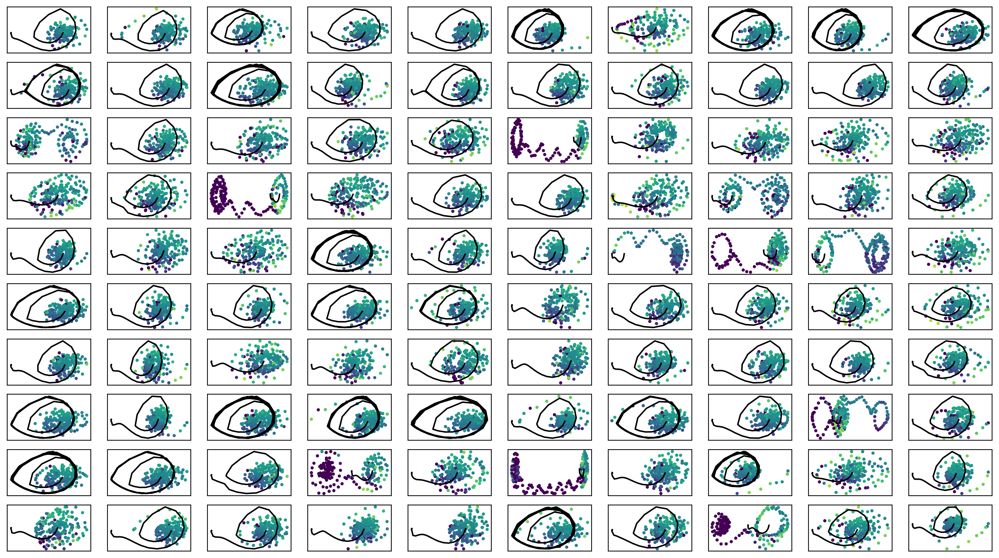

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.3
train_weighted_vae: enc_dec
train: iter 0  trainloss -136.56610  validloss -144.88224±0.00000  bestvalidloss -144.88224  last_update 0
train: iter 1  trainloss -138.53436  validloss -128.19482±0.00000  bestvalidloss -144.88224  last_update 1
train: iter 2  trainloss -140.34508  validloss -140.13925±0.00000  bestvalidloss -144.88224  last_update 2
train: iter 3  trainloss -141.65302  validloss -136.13329±0.00000  bestvalidloss -144.88224  last_update 3
train: iter 4  trainloss -136.52187  validloss -134.59029±0.00000  bestvalidloss -144.88224  last_update 4
train: iter 5  trainloss -141.35784  validloss -130.80321±0.00000  bestvalidloss -144.88224  last_update 5
train: iter 6  trainloss -140.73691  validloss -138.75010±0.00000  bestvalidloss -144.88224  last_update 6
train: iter 7  trainloss -140.33946  validloss -137.83797±0.00000  bestvalidloss -144.88224  last_update 7
train: iter 8  trainloss -139.11797  validloss -137.60616±0.00000  bestvalidloss -144.88224  last_u

train: iter 75  trainloss -135.27943  validloss -138.59715±0.00000  bestvalidloss -144.88224  last_update 75
train: iter 76  trainloss -134.72255  validloss -136.11363±0.00000  bestvalidloss -144.88224  last_update 76
train: iter 77  trainloss -133.75076  validloss -134.46027±0.00000  bestvalidloss -144.88224  last_update 77
train: iter 78  trainloss -130.41533  validloss -138.47388±0.00000  bestvalidloss -144.88224  last_update 78
train: iter 79  trainloss -133.90103  validloss -131.60505±0.00000  bestvalidloss -144.88224  last_update 79
train: iter 80  trainloss -133.32648  validloss -138.60605±0.00000  bestvalidloss -144.88224  last_update 80
train: iter 81  trainloss -133.48865  validloss -142.29377±0.00000  bestvalidloss -144.88224  last_update 81
train: iter 82  trainloss -134.42795  validloss -141.70554±0.00000  bestvalidloss -144.88224  last_update 82
train: iter 83  trainloss -133.93679  validloss -136.41138±0.00000  bestvalidloss -144.88224  last_update 83
train: iter 84  tra

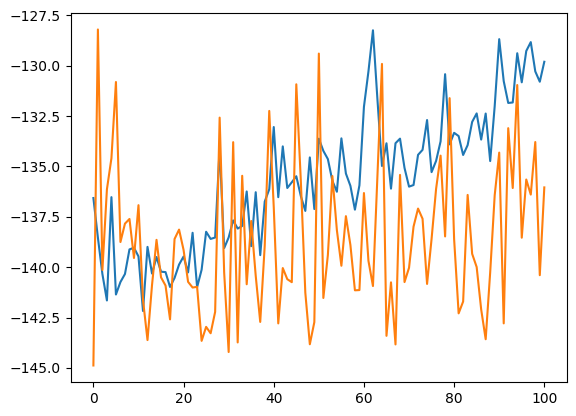

alpha 0.3 default_lr 0.0005


In [15]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [16]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


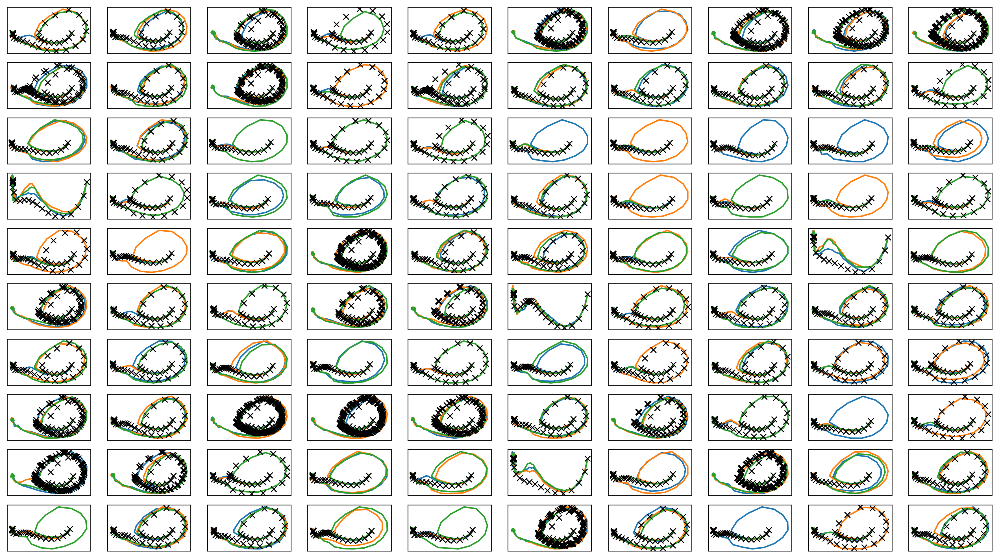

In [17]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter1.png")
plt.savefig(figfilenamehead+"joint_iter1.eps")
# plt.savefig(figfilenamehead+"joint_iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

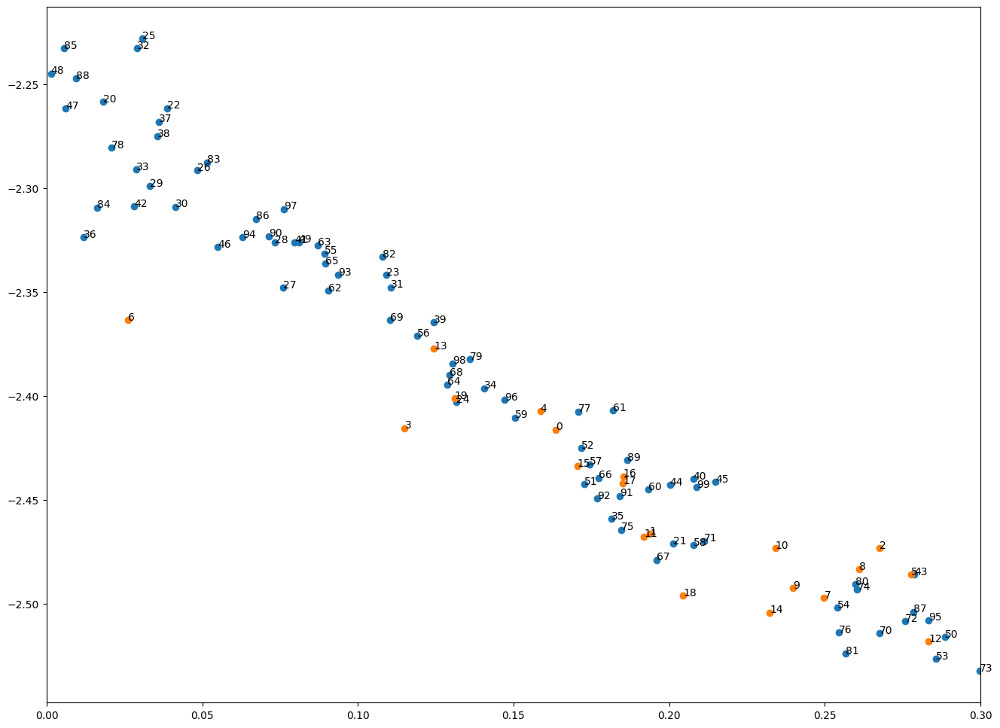

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [18]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [19]:
print(datetime.datetime.now())

2023-06-06 12:53:22.186091


# Iter2

In [20]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [21]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.15322  validloss 0.16771±0.00000  bestvalidloss 0.16771  last_update 0
train: iter 1  trainloss 0.14612  validloss 0.13307±0.00000  bestvalidloss 0.13307  last_update 0
train: iter 2  trainloss 0.14561  validloss 0.13697±0.00000  bestvalidloss 0.13307  last_update 1
train: iter 3  trainloss 0.14612  validloss 0.13444±0.00000  bestvalidloss 0.13307  last_update 2
train: iter 4  trainloss 0.14402  validloss 0.13290±0.00000  bestvalidloss 0.13290  last_update 0
train: iter 5  trainloss 0.14300  validloss 0.13223±0.00000  bestvalidloss 0.13223  last_update 0
train: iter 6  trainloss 0.14211  validloss 0.13440±0.00000  bestvalidloss 0.13223  last_update 1
train: iter 7  trainloss 0.14221  validloss 0.13116±0.00000  bestvalidloss 0.13116  last_update 0
train: iter 8  trainloss 0.14368  validloss 0.13134±0.00000  bestvalidloss 0.13116  last_update 1
train: iter 9  trainloss 0.14305  validloss 0.13223±0.00000  bestvalidloss 0.13116  last_update 2
train: iter 10  trai

train: iter 83  trainloss 0.13815  validloss 0.12844±0.00000  bestvalidloss 0.12844  last_update 0
train: iter 84  trainloss 0.14083  validloss 0.13789±0.00000  bestvalidloss 0.12844  last_update 1
train: iter 85  trainloss 0.13899  validloss 0.13034±0.00000  bestvalidloss 0.12844  last_update 2
train: iter 86  trainloss 0.14012  validloss 0.13110±0.00000  bestvalidloss 0.12844  last_update 3
train: iter 87  trainloss 0.14021  validloss 0.13049±0.00000  bestvalidloss 0.12844  last_update 4
train: iter 88  trainloss 0.13770  validloss 0.12894±0.00000  bestvalidloss 0.12844  last_update 5
train: iter 89  trainloss 0.13649  validloss 0.13133±0.00000  bestvalidloss 0.12844  last_update 6
train: iter 90  trainloss 0.13729  validloss 0.13469±0.00000  bestvalidloss 0.12844  last_update 7
train: iter 91  trainloss 0.13807  validloss 0.12947±0.00000  bestvalidloss 0.12844  last_update 8
train: iter 92  trainloss 0.14025  validloss 0.12895±0.00000  bestvalidloss 0.12844  last_update 9
train: ite

train: iter 165  trainloss 0.13593  validloss 0.13170±0.00000  bestvalidloss 0.12754  last_update 18
train: iter 166  trainloss 0.13740  validloss 0.12983±0.00000  bestvalidloss 0.12754  last_update 19
train: iter 167  trainloss 0.13680  validloss 0.13263±0.00000  bestvalidloss 0.12754  last_update 20
train: iter 168  trainloss 0.13590  validloss 0.12786±0.00000  bestvalidloss 0.12754  last_update 21
train: iter 169  trainloss 0.13732  validloss 0.12855±0.00000  bestvalidloss 0.12754  last_update 22
train: iter 170  trainloss 0.13801  validloss 0.12834±0.00000  bestvalidloss 0.12754  last_update 23
train: iter 171  trainloss 0.13628  validloss 0.12922±0.00000  bestvalidloss 0.12754  last_update 24
train: iter 172  trainloss 0.13630  validloss 0.12807±0.00000  bestvalidloss 0.12754  last_update 25
train: iter 173  trainloss 0.13579  validloss 0.12986±0.00000  bestvalidloss 0.12754  last_update 26
train: iter 174  trainloss 0.13690  validloss 0.13516±0.00000  bestvalidloss 0.12754  last_

train: iter 247  trainloss 0.13529  validloss 0.12976±0.00000  bestvalidloss 0.12754  last_update 100
train: fin


([0.1532153060659766,
  0.1461202290840447,
  0.14561366620473565,
  0.14611520301550626,
  0.1440191143192351,
  0.142999618453905,
  0.14210622762329878,
  0.1422101256903261,
  0.14367871559225023,
  0.1430463167373091,
  0.14073839676566421,
  0.1419342068489641,
  0.1418463731650263,
  0.14197088414803147,
  0.14126579579897225,
  0.14174047182314098,
  0.1401339222677052,
  0.1407571082934737,
  0.14146151961758732,
  0.14119444778189064,
  0.14207562957890332,
  0.14209571275860072,
  0.14087050622329117,
  0.1398878161329776,
  0.140594866219908,
  0.1415559527464211,
  0.14154386739246547,
  0.14059887039475144,
  0.1418468777090311,
  0.14125783191993832,
  0.14100967296399175,
  0.1397372731938958,
  0.14237627577967943,
  0.14127691863104702,
  0.13892671349458396,
  0.14034877512604,
  0.14000365748070182,
  0.14021788998506962,
  0.13998132911510766,
  0.13979941406287252,
  0.13942354451864958,
  0.13966055917553605,
  0.13910976336337627,
  0.1396756364032626,
  0.13961

In [22]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.9514618238344786
valid_loss:  -0.5346638266146183
weight_alpha 1.0 h_min_tilde -5.859415 ell_tilde -0.8681022243905064 kappa_tilde 0.00044760260453770333
train_loss:  -0.7587856565639377
valid_loss:  -0.7434548603057862
weight_alpha 0.3 h_min_tilde -5.859415 ell_tilde -0.7557194973123075 kappa_tilde 0.00044264709655930613


1e-08 1000.0


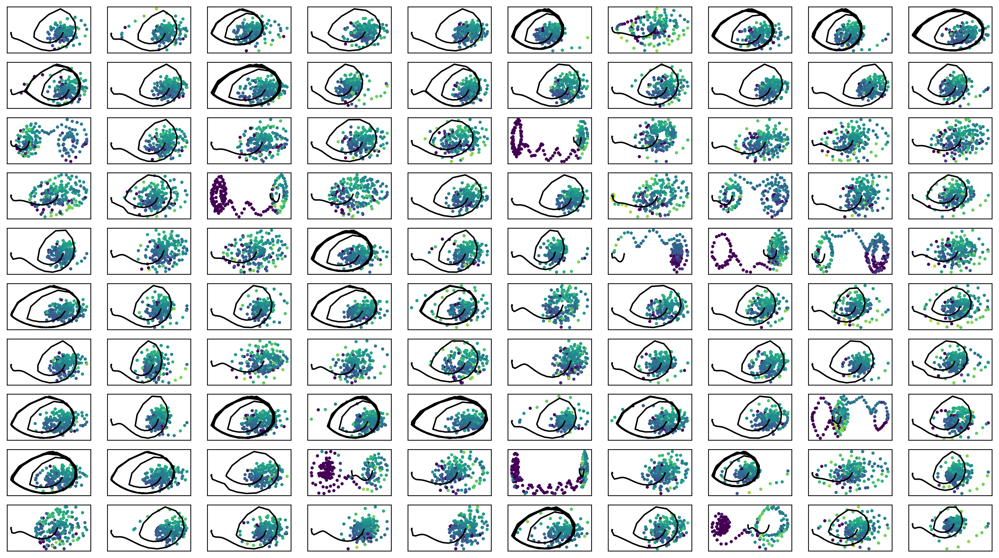

In [23]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [24]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.3
train_weighted_vae: enc_dec
train: iter 0  trainloss -148.26767  validloss -148.37456±0.00000  bestvalidloss -148.37456  last_update 0
train: iter 1  trainloss -149.13282  validloss -134.98440±0.00000  bestvalidloss -148.37456  last_update 1
train: iter 2  trainloss -149.41481  validloss -144.67026±0.00000  bestvalidloss -148.37456  last_update 2
train: iter 3  trainloss -145.40669  validloss -150.65226±0.00000  bestvalidloss -150.65226  last_update 0
train: iter 4  trainloss -148.74213  validloss -138.47734±0.00000  bestvalidloss -150.65226  last_update 1
train: iter 5  trainloss -147.15900  validloss -145.11376±0.00000  bestvalidloss -150.65226  last_update 2
train: iter 6  trainloss -151.27178  validloss -145.45925±0.00000  bestvalidloss -150.65226  last_update 3
train: iter 7  trainloss -149.94278  validloss -148.99032±0.00000  bestvalidloss -150.65226  last_update 4
train: iter 8  trainloss -148.71295  validloss -143.61333±0.00000  bestvalidloss -150.65226  last_u

train: iter 75  trainloss -137.51458  validloss -143.00774±0.00000  bestvalidloss -150.65226  last_update 72
train: iter 76  trainloss -136.12809  validloss -144.56882±0.00000  bestvalidloss -150.65226  last_update 73
train: iter 77  trainloss -135.57362  validloss -139.31013±0.00000  bestvalidloss -150.65226  last_update 74
train: iter 78  trainloss -136.80667  validloss -131.08992±0.00000  bestvalidloss -150.65226  last_update 75
train: iter 79  trainloss -136.20346  validloss -138.75003±0.00000  bestvalidloss -150.65226  last_update 76
train: iter 80  trainloss -135.87336  validloss -142.28980±0.00000  bestvalidloss -150.65226  last_update 77
train: iter 81  trainloss -134.14187  validloss -143.85408±0.00000  bestvalidloss -150.65226  last_update 78
train: iter 82  trainloss -136.08068  validloss -143.09018±0.00000  bestvalidloss -150.65226  last_update 79
train: iter 83  trainloss -137.20528  validloss -144.94935±0.00000  bestvalidloss -150.65226  last_update 80
train: iter 84  tra

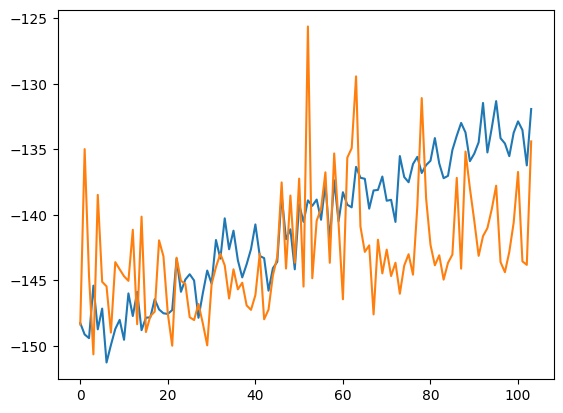

alpha 0.3 default_lr 0.0005


In [25]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [26]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


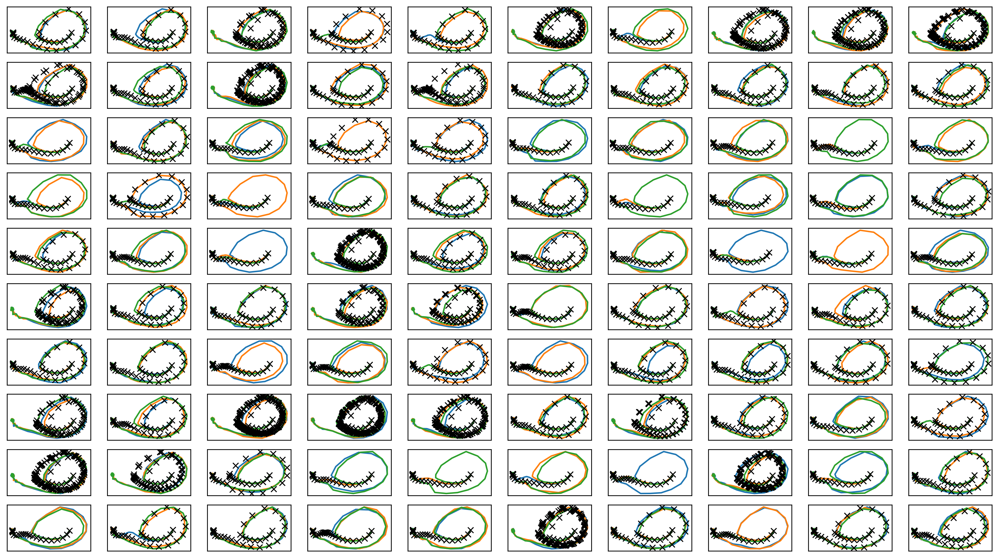

In [27]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
# plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

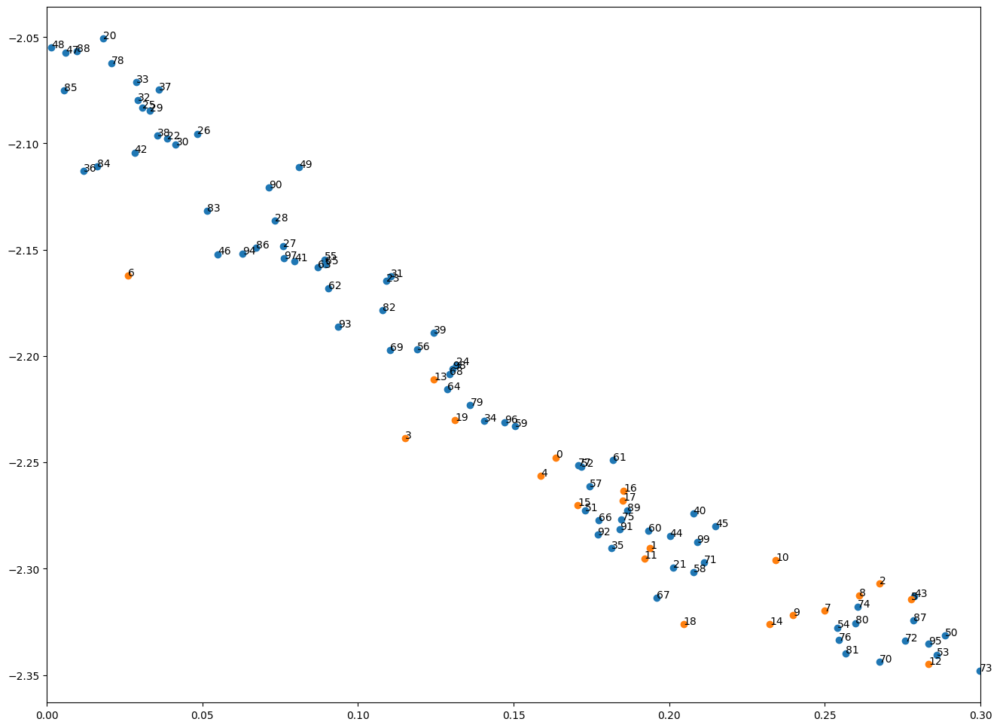

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [28]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [29]:
print(datetime.datetime.now())

2023-06-06 12:55:19.600933


# Iter 3

In [30]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [31]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.14093  validloss 0.12733±0.00000  bestvalidloss 0.12733  last_update 0
train: iter 1  trainloss 0.13587  validloss 0.11131±0.00000  bestvalidloss 0.11131  last_update 0
train: iter 2  trainloss 0.13482  validloss 0.11022±0.00000  bestvalidloss 0.11022  last_update 0
train: iter 3  trainloss 0.13241  validloss 0.10884±0.00000  bestvalidloss 0.10884  last_update 0
train: iter 4  trainloss 0.13402  validloss 0.11249±0.00000  bestvalidloss 0.10884  last_update 1
train: iter 5  trainloss 0.13380  validloss 0.11660±0.00000  bestvalidloss 0.10884  last_update 2
train: iter 6  trainloss 0.13164  validloss 0.10894±0.00000  bestvalidloss 0.10884  last_update 3
train: iter 7  trainloss 0.13273  validloss 0.11079±0.00000  bestvalidloss 0.10884  last_update 4
train: iter 8  trainloss 0.13365  validloss 0.10923±0.00000  bestvalidloss 0.10884  last_update 5
train: iter 9  trainloss 0.13275  validloss 0.11013±0.00000  bestvalidloss 0.10884  last_update 6
train: iter 10  trai

train: iter 83  trainloss 0.12950  validloss 0.11217±0.00000  bestvalidloss 0.10805  last_update 23
train: iter 84  trainloss 0.12984  validloss 0.11445±0.00000  bestvalidloss 0.10805  last_update 24
train: iter 85  trainloss 0.13018  validloss 0.12060±0.00000  bestvalidloss 0.10805  last_update 25
train: iter 86  trainloss 0.13286  validloss 0.10882±0.00000  bestvalidloss 0.10805  last_update 26
train: iter 87  trainloss 0.12928  validloss 0.11042±0.00000  bestvalidloss 0.10805  last_update 27
train: iter 88  trainloss 0.13028  validloss 0.11149±0.00000  bestvalidloss 0.10805  last_update 28
train: iter 89  trainloss 0.13049  validloss 0.10986±0.00000  bestvalidloss 0.10805  last_update 29
train: iter 90  trainloss 0.13021  validloss 0.10838±0.00000  bestvalidloss 0.10805  last_update 30
train: iter 91  trainloss 0.12958  validloss 0.10840±0.00000  bestvalidloss 0.10805  last_update 31
train: iter 92  trainloss 0.12993  validloss 0.11210±0.00000  bestvalidloss 0.10805  last_update 32


train: iter 166  trainloss 0.12922  validloss 0.11522±0.00000  bestvalidloss 0.10724  last_update 44
train: iter 167  trainloss 0.12943  validloss 0.10974±0.00000  bestvalidloss 0.10724  last_update 45
train: iter 168  trainloss 0.12863  validloss 0.11442±0.00000  bestvalidloss 0.10724  last_update 46
train: iter 169  trainloss 0.13128  validloss 0.11354±0.00000  bestvalidloss 0.10724  last_update 47
train: iter 170  trainloss 0.13072  validloss 0.10713±0.00000  bestvalidloss 0.10713  last_update 0
train: iter 171  trainloss 0.12817  validloss 0.11018±0.00000  bestvalidloss 0.10713  last_update 1
train: iter 172  trainloss 0.12757  validloss 0.10800±0.00000  bestvalidloss 0.10713  last_update 2
train: iter 173  trainloss 0.13040  validloss 0.11790±0.00000  bestvalidloss 0.10713  last_update 3
train: iter 174  trainloss 0.12913  validloss 0.10905±0.00000  bestvalidloss 0.10713  last_update 4
train: iter 175  trainloss 0.12835  validloss 0.11224±0.00000  bestvalidloss 0.10713  last_updat

train: iter 248  trainloss 0.12733  validloss 0.11215±0.00000  bestvalidloss 0.10615  last_update 9
train: iter 249  trainloss 0.12736  validloss 0.10782±0.00000  bestvalidloss 0.10615  last_update 10
train: iter 250  trainloss 0.12625  validloss 0.10965±0.00000  bestvalidloss 0.10615  last_update 11
train: iter 251  trainloss 0.12643  validloss 0.11207±0.00000  bestvalidloss 0.10615  last_update 12
train: iter 252  trainloss 0.12649  validloss 0.10681±0.00000  bestvalidloss 0.10615  last_update 13
train: iter 253  trainloss 0.12593  validloss 0.10566±0.00000  bestvalidloss 0.10566  last_update 0
train: iter 254  trainloss 0.12633  validloss 0.10772±0.00000  bestvalidloss 0.10566  last_update 1
train: iter 255  trainloss 0.12676  validloss 0.10711±0.00000  bestvalidloss 0.10566  last_update 2
train: iter 256  trainloss 0.12709  validloss 0.10911±0.00000  bestvalidloss 0.10566  last_update 3
train: iter 257  trainloss 0.12554  validloss 0.10852±0.00000  bestvalidloss 0.10566  last_updat

train: iter 330  trainloss 0.12727  validloss 0.11334±0.00000  bestvalidloss 0.10550  last_update 34
train: iter 331  trainloss 0.12663  validloss 0.11156±0.00000  bestvalidloss 0.10550  last_update 35
train: iter 332  trainloss 0.12547  validloss 0.10699±0.00000  bestvalidloss 0.10550  last_update 36
train: iter 333  trainloss 0.12702  validloss 0.10740±0.00000  bestvalidloss 0.10550  last_update 37
train: iter 334  trainloss 0.12516  validloss 0.11129±0.00000  bestvalidloss 0.10550  last_update 38
train: iter 335  trainloss 0.12553  validloss 0.10502±0.00000  bestvalidloss 0.10502  last_update 0
train: iter 336  trainloss 0.12534  validloss 0.10572±0.00000  bestvalidloss 0.10502  last_update 1
train: iter 337  trainloss 0.12538  validloss 0.10579±0.00000  bestvalidloss 0.10502  last_update 2
train: iter 338  trainloss 0.12692  validloss 0.10639±0.00000  bestvalidloss 0.10502  last_update 3
train: iter 339  trainloss 0.12601  validloss 0.10827±0.00000  bestvalidloss 0.10502  last_upda

train: iter 412  trainloss 0.12462  validloss 0.10648±0.00000  bestvalidloss 0.10477  last_update 34
train: iter 413  trainloss 0.12434  validloss 0.10503±0.00000  bestvalidloss 0.10477  last_update 35
train: iter 414  trainloss 0.12416  validloss 0.10772±0.00000  bestvalidloss 0.10477  last_update 36
train: iter 415  trainloss 0.12485  validloss 0.10617±0.00000  bestvalidloss 0.10477  last_update 37
train: iter 416  trainloss 0.12525  validloss 0.10622±0.00000  bestvalidloss 0.10477  last_update 38
train: iter 417  trainloss 0.12357  validloss 0.10831±0.00000  bestvalidloss 0.10477  last_update 39
train: iter 418  trainloss 0.12506  validloss 0.10659±0.00000  bestvalidloss 0.10477  last_update 40
train: iter 419  trainloss 0.12542  validloss 0.10661±0.00000  bestvalidloss 0.10477  last_update 41
train: iter 420  trainloss 0.12866  validloss 0.10836±0.00000  bestvalidloss 0.10477  last_update 42
train: iter 421  trainloss 0.12458  validloss 0.10600±0.00000  bestvalidloss 0.10477  last_

train: iter 495  trainloss 0.12430  validloss 0.10646±0.00000  bestvalidloss 0.10397  last_update 39
train: iter 496  trainloss 0.12369  validloss 0.10790±0.00000  bestvalidloss 0.10397  last_update 40
train: iter 497  trainloss 0.12395  validloss 0.10724±0.00000  bestvalidloss 0.10397  last_update 41
train: iter 498  trainloss 0.12411  validloss 0.10549±0.00000  bestvalidloss 0.10397  last_update 42
train: iter 499  trainloss 0.12315  validloss 0.10470±0.00000  bestvalidloss 0.10397  last_update 43
train: iter 500  trainloss 0.12326  validloss 0.10593±0.00000  bestvalidloss 0.10397  last_update 44
train: iter 501  trainloss 0.12321  validloss 0.10633±0.00000  bestvalidloss 0.10397  last_update 45
train: iter 502  trainloss 0.12351  validloss 0.10629±0.00000  bestvalidloss 0.10397  last_update 46
train: iter 503  trainloss 0.12398  validloss 0.10620±0.00000  bestvalidloss 0.10397  last_update 47
train: iter 504  trainloss 0.12333  validloss 0.10543±0.00000  bestvalidloss 0.10397  last_

train: iter 578  trainloss 0.12335  validloss 0.10508±0.00000  bestvalidloss 0.10374  last_update 65
train: iter 579  trainloss 0.12422  validloss 0.10518±0.00000  bestvalidloss 0.10374  last_update 66
train: iter 580  trainloss 0.12429  validloss 0.10722±0.00000  bestvalidloss 0.10374  last_update 67
train: iter 581  trainloss 0.12185  validloss 0.10592±0.00000  bestvalidloss 0.10374  last_update 68
train: iter 582  trainloss 0.12385  validloss 0.10780±0.00000  bestvalidloss 0.10374  last_update 69
train: iter 583  trainloss 0.12492  validloss 0.10759±0.00000  bestvalidloss 0.10374  last_update 70
train: iter 584  trainloss 0.12321  validloss 0.10475±0.00000  bestvalidloss 0.10374  last_update 71
train: iter 585  trainloss 0.12323  validloss 0.10573±0.00000  bestvalidloss 0.10374  last_update 72
train: iter 586  trainloss 0.12308  validloss 0.10698±0.00000  bestvalidloss 0.10374  last_update 73
train: iter 587  trainloss 0.12274  validloss 0.10540±0.00000  bestvalidloss 0.10374  last_

([0.1409342410042882,
  0.13586714211851358,
  0.13482312238775193,
  0.13240841855295002,
  0.13402133914642037,
  0.1338021489791572,
  0.131638080207631,
  0.1327324247919023,
  0.13364702118560673,
  0.13275084579363466,
  0.13281087721697987,
  0.13313674493692815,
  0.13330532433465123,
  0.13095414550043644,
  0.13539479011669756,
  0.13314011986367405,
  0.13108976176008583,
  0.13277373323217034,
  0.13311019549146294,
  0.1332700837869197,
  0.13249644194729626,
  0.1337347059044987,
  0.13114963728003204,
  0.13039845931343735,
  0.13016942436806858,
  0.1323054795153439,
  0.13175466069951652,
  0.13346089986152948,
  0.13101336886174977,
  0.13368425504304468,
  0.13183057429268957,
  0.13097251928411424,
  0.13079641587100924,
  0.13211038671433925,
  0.13104922897182406,
  0.13345704637467862,
  0.13374315518885851,
  0.13100001630373298,
  0.13310170639306307,
  0.13070658650249242,
  0.12999827633611857,
  0.13151969942264258,
  0.1300923028960824,
  0.1302122248802334

In [32]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.7841179662778973
valid_loss:  -0.43022522485256187
weight_alpha 1.0 h_min_tilde -5.807994 ell_tilde -0.7133394179928303 kappa_tilde 0.00044303968810944686
train_loss:  -0.7150532120823861
valid_loss:  -0.7348986890792848
weight_alpha 0.3 h_min_tilde -5.807994 ell_tilde -0.7190223074817658 kappa_tilde 0.0004432869918173511


1e-08 1000.0


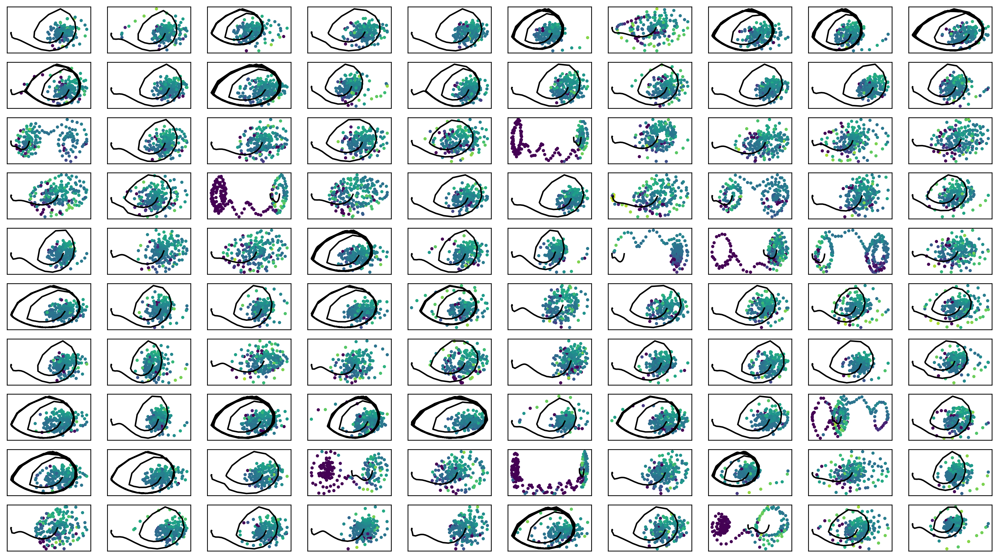

In [33]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [34]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.3
train_weighted_vae: enc_dec
train: iter 0  trainloss -135.72521  validloss -146.29396±0.00000  bestvalidloss -146.29396  last_update 0
train: iter 1  trainloss -140.64924  validloss -143.19026±0.00000  bestvalidloss -146.29396  last_update 1
train: iter 2  trainloss -140.40892  validloss -143.24902±0.00000  bestvalidloss -146.29396  last_update 2
train: iter 3  trainloss -136.55491  validloss -142.13547±0.00000  bestvalidloss -146.29396  last_update 3
train: iter 4  trainloss -139.72727  validloss -145.29760±0.00000  bestvalidloss -146.29396  last_update 4
train: iter 5  trainloss -138.08936  validloss -138.94649±0.00000  bestvalidloss -146.29396  last_update 5
train: iter 6  trainloss -140.26073  validloss -140.23460±0.00000  bestvalidloss -146.29396  last_update 6
train: iter 7  trainloss -137.98674  validloss -140.20422±0.00000  bestvalidloss -146.29396  last_update 7
train: iter 8  trainloss -137.79709  validloss -137.26824±0.00000  bestvalidloss -146.29396  last_u

train: iter 76  trainloss -129.90861  validloss -140.67672±0.00000  bestvalidloss -147.03997  last_update 57
train: iter 77  trainloss -130.27750  validloss -143.06379±0.00000  bestvalidloss -147.03997  last_update 58
train: iter 78  trainloss -129.45208  validloss -139.53452±0.00000  bestvalidloss -147.03997  last_update 59
train: iter 79  trainloss -125.72965  validloss -126.09338±0.00000  bestvalidloss -147.03997  last_update 60
train: iter 80  trainloss -129.39006  validloss -140.19904±0.00000  bestvalidloss -147.03997  last_update 61
train: iter 81  trainloss -126.85510  validloss -138.66397±0.00000  bestvalidloss -147.03997  last_update 62
train: iter 82  trainloss -130.53428  validloss -135.82140±0.00000  bestvalidloss -147.03997  last_update 63
train: iter 83  trainloss -131.27493  validloss -134.52398±0.00000  bestvalidloss -147.03997  last_update 64
train: iter 84  trainloss -127.87308  validloss -141.43461±0.00000  bestvalidloss -147.03997  last_update 65
train: iter 85  tra

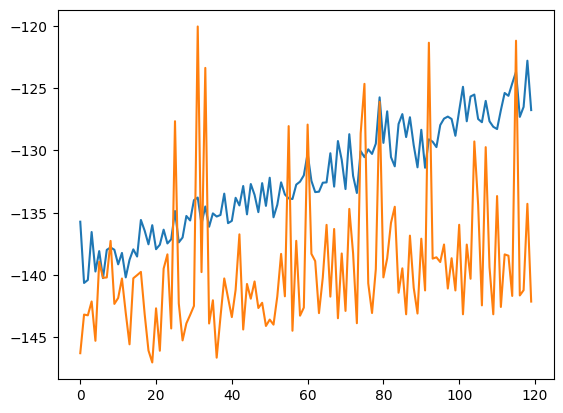

alpha 0.3 default_lr 0.0005


In [35]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [36]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)


0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


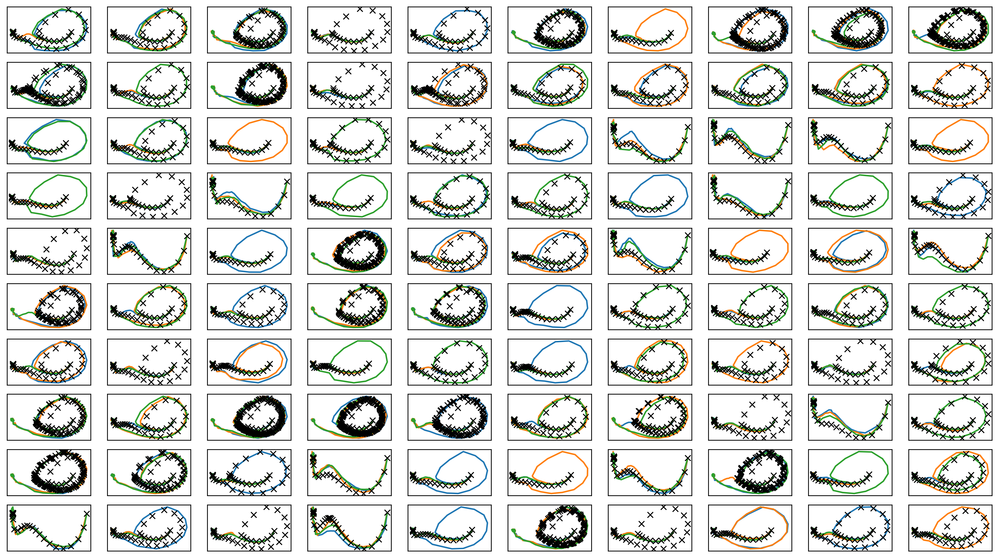

In [37]:

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
# plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

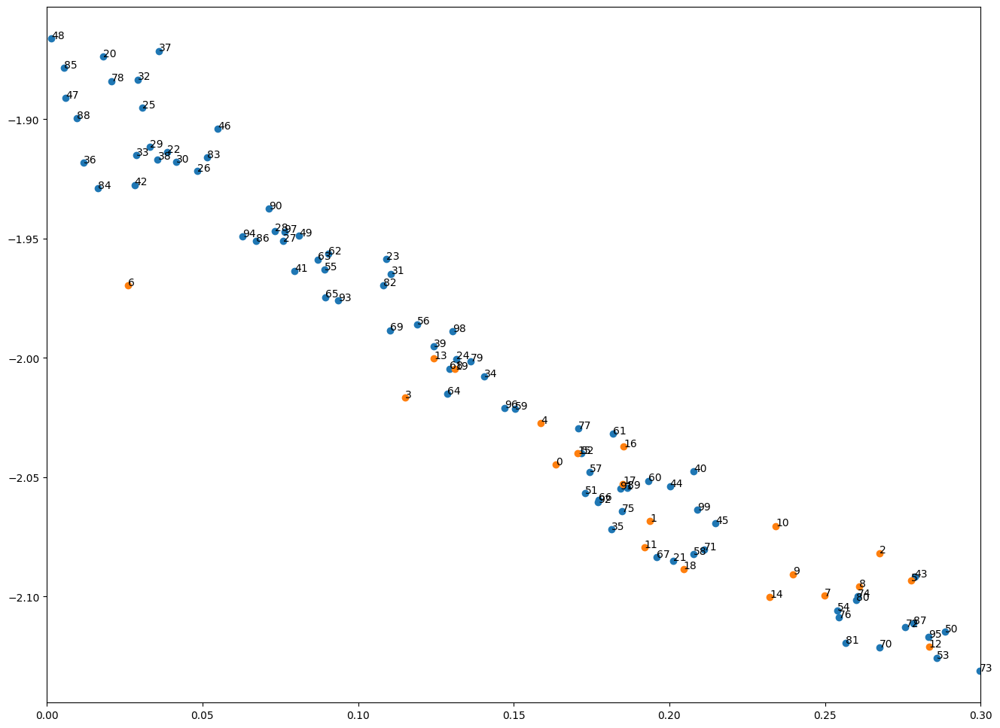

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [38]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [39]:
print(datetime.datetime.now())

2023-06-06 12:58:43.413972


# 評価関数計算

In [40]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [41]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

train: iter 0  trainloss 0.13847  validloss 0.14892±0.00000  bestvalidloss 0.14892  last_update 0
train: iter 1  trainloss 0.13044  validloss 0.11581±0.00000  bestvalidloss 0.11581  last_update 0
train: iter 2  trainloss 0.12835  validloss 0.11440±0.00000  bestvalidloss 0.11440  last_update 0
train: iter 3  trainloss 0.12816  validloss 0.11336±0.00000  bestvalidloss 0.11336  last_update 0
train: iter 4  trainloss 0.12831  validloss 0.11482±0.00000  bestvalidloss 0.11336  last_update 1
train: iter 5  trainloss 0.12731  validloss 0.11696±0.00000  bestvalidloss 0.11336  last_update 2
train: iter 6  trainloss 0.12907  validloss 0.11582±0.00000  bestvalidloss 0.11336  last_update 3
train: iter 7  trainloss 0.12635  validloss 0.11449±0.00000  bestvalidloss 0.11336  last_update 4
train: iter 8  trainloss 0.12950  validloss 0.11693±0.00000  bestvalidloss 0.11336  last_update 5
train: iter 9  trainloss 0.12722  validloss 0.11726±0.00000  bestvalidloss 0.11336  last_update 6
train: iter 10  trai

train: iter 84  trainloss 0.12341  validloss 0.11429±0.00000  bestvalidloss 0.11336  last_update 81
train: iter 85  trainloss 0.12261  validloss 0.11849±0.00000  bestvalidloss 0.11336  last_update 82
train: iter 86  trainloss 0.12413  validloss 0.11607±0.00000  bestvalidloss 0.11336  last_update 83
train: iter 87  trainloss 0.12362  validloss 0.11650±0.00000  bestvalidloss 0.11336  last_update 84
train: iter 88  trainloss 0.12462  validloss 0.11367±0.00000  bestvalidloss 0.11336  last_update 85
train: iter 89  trainloss 0.12363  validloss 0.11866±0.00000  bestvalidloss 0.11336  last_update 86
train: iter 90  trainloss 0.12322  validloss 0.11587±0.00000  bestvalidloss 0.11336  last_update 87
train: iter 91  trainloss 0.12431  validloss 0.11803±0.00000  bestvalidloss 0.11336  last_update 88
train: iter 92  trainloss 0.12927  validloss 0.12016±0.00000  bestvalidloss 0.11336  last_update 89
train: iter 93  trainloss 0.12332  validloss 0.11415±0.00000  bestvalidloss 0.11336  last_update 90


([0.1384650230873376,
  0.13044169452041388,
  0.12834789897315205,
  0.12816209779120982,
  0.12830879450775684,
  0.12730737922247498,
  0.12907475377433003,
  0.12634887280873955,
  0.12950495388358832,
  0.12721761735156178,
  0.12729903957806527,
  0.12705667298287154,
  0.1278477523010224,
  0.12726210041437297,
  0.12774516651406884,
  0.12638332152273507,
  0.12668121354654432,
  0.12632963196374475,
  0.12750249383971096,
  0.12551903787534685,
  0.12505802400410176,
  0.12673948486335576,
  0.125044251838699,
  0.12551492506172507,
  0.12554201460443437,
  0.12486837243195623,
  0.1273936284240335,
  0.12581707602366804,
  0.12475781487300992,
  0.1262962576933205,
  0.12548489684704692,
  0.12668436900712549,
  0.12575571085326373,
  0.12593978601507844,
  0.12667443086393176,
  0.12608435577712954,
  0.12481675609014928,
  0.12594451536424459,
  0.1253700362984091,
  0.12447313368320465,
  0.1251554874703288,
  0.1260967702139169,
  0.12452291364315897,
  0.1262411336880177

In [42]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
print(loss_list)
print(normalized_loss_list)

train_loss:  -0.6834391334220767
valid_loss:  -0.39976024671792976
weight_alpha 1.0 h_min_tilde -5.9549446 ell_tilde -0.6267033560812474 kappa_tilde 0.0004332195626697627
train_loss:  -0.6799597771018744
valid_loss:  -0.6884457750320434
weight_alpha 0.3 h_min_tilde -5.9549446 ell_tilde -0.6816569766879083 kappa_tilde 0.0004354710310422598
[(-0.5483260105699301, -0.356260113286972), (-0.9514618238344786, -0.5346638266146183), (-0.7841179662778973, -0.43022522485256187), (-0.6834391334220767, -0.39976024671792976)]
[(-0.6928869175255298, -0.7277799558639527), (-0.7587856565639377, -0.7434548603057862), (-0.7150532120823861, -0.7348986890792848), (-0.6799597771018744, -0.6884457750320434)]


In [43]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=default_early)


train: iter 0  trainloss 10.08327  validloss 9.43764±0.00000  bestvalidloss 9.43764  last_update 0
train: iter 1  trainloss 6.80635  validloss 6.11457±0.00000  bestvalidloss 6.11457  last_update 0
train: iter 2  trainloss 4.54006  validloss 3.93579±0.00000  bestvalidloss 3.93579  last_update 0
train: iter 3  trainloss 3.03752  validloss 2.42462±0.00000  bestvalidloss 2.42462  last_update 0
train: iter 4  trainloss 1.84416  validloss 1.17670±0.00000  bestvalidloss 1.17670  last_update 0
train: iter 5  trainloss 1.01925  validloss 0.38114±0.00000  bestvalidloss 0.38114  last_update 0
train: iter 6  trainloss 0.44770  validloss -0.05823±0.00000  bestvalidloss -0.05823  last_update 0
train: iter 7  trainloss -0.00504  validloss -0.51587±0.00000  bestvalidloss -0.51587  last_update 0
train: iter 8  trainloss -0.30999  validloss -0.73417±0.00000  bestvalidloss -0.73417  last_update 0
train: iter 9  trainloss -0.49017  validloss -0.86965±0.00000  bestvalidloss -0.86965  last_update 0
train: i

train: iter 93  trainloss -1.09658  validloss -1.19807±0.00000  bestvalidloss -1.28244  last_update 7
train: iter 94  trainloss -1.10851  validloss -1.21354±0.00000  bestvalidloss -1.28244  last_update 8
train: iter 95  trainloss -1.11525  validloss -1.14689±0.00000  bestvalidloss -1.28244  last_update 9
train: iter 96  trainloss -1.12950  validloss -1.19820±0.00000  bestvalidloss -1.28244  last_update 10
train: iter 97  trainloss -1.11569  validloss -1.25478±0.00000  bestvalidloss -1.28244  last_update 11
train: iter 98  trainloss -1.09313  validloss -1.19516±0.00000  bestvalidloss -1.28244  last_update 12
train: iter 99  trainloss -1.07500  validloss -1.17860±0.00000  bestvalidloss -1.28244  last_update 13
train: iter 100  trainloss -1.16131  validloss -1.19070±0.00000  bestvalidloss -1.28244  last_update 14
train: iter 101  trainloss -1.11466  validloss -1.16520±0.00000  bestvalidloss -1.28244  last_update 15
train: iter 102  trainloss -1.11850  validloss -1.24833±0.00000  bestvalid

train: iter 189  trainloss -1.10712  validloss -1.22818±0.00000  bestvalidloss -1.30354  last_update 34
train: iter 190  trainloss -1.14945  validloss -1.22304±0.00000  bestvalidloss -1.30354  last_update 35
train: iter 191  trainloss -1.11357  validloss -1.22533±0.00000  bestvalidloss -1.30354  last_update 36
train: iter 192  trainloss -1.14083  validloss -1.22325±0.00000  bestvalidloss -1.30354  last_update 37
train: iter 193  trainloss -1.15534  validloss -1.22122±0.00000  bestvalidloss -1.30354  last_update 38
train: iter 194  trainloss -1.11258  validloss -1.24323±0.00000  bestvalidloss -1.30354  last_update 39
train: iter 195  trainloss -1.12042  validloss -1.19271±0.00000  bestvalidloss -1.30354  last_update 40
train: iter 196  trainloss -1.08782  validloss -1.26504±0.00000  bestvalidloss -1.30354  last_update 41
train: iter 197  trainloss -1.12360  validloss -1.19714±0.00000  bestvalidloss -1.30354  last_update 42
train: iter 198  trainloss -1.12362  validloss -1.26553±0.00000 

In [44]:
print(iwvi.initial_belief)


Parameter containing:
tensor([-1.9986, -5.0656], requires_grad=True)


In [45]:
train_curve, valid_curve = iwvi.train_penalty(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early)

train: iter 0  trainloss 13.72155  validloss 61.57192±0.00000  bestvalidloss 61.57192  last_update 0
train: iter 1  trainloss 2.73408  validloss 1.02945±0.00000  bestvalidloss 1.02945  last_update 0
train: iter 2  trainloss 2.81224  validloss 1.14512±0.00000  bestvalidloss 1.02945  last_update 1
train: iter 3  trainloss 2.72764  validloss 0.96959±0.00000  bestvalidloss 0.96959  last_update 0
train: iter 4  trainloss 2.71432  validloss 1.09718±0.00000  bestvalidloss 0.96959  last_update 1
train: iter 5  trainloss 2.78853  validloss 0.99732±0.00000  bestvalidloss 0.96959  last_update 2
train: iter 6  trainloss 2.81137  validloss 1.05091±0.00000  bestvalidloss 0.96959  last_update 3
train: iter 7  trainloss 2.67615  validloss 1.13255±0.00000  bestvalidloss 0.96959  last_update 4
train: iter 8  trainloss 2.77574  validloss 1.10019±0.00000  bestvalidloss 0.96959  last_update 5
train: iter 9  trainloss 2.79681  validloss 1.01233±0.00000  bestvalidloss 0.96959  last_update 6
train: iter 10  t

train: iter 84  trainloss 2.73444  validloss 0.99382±0.00000  bestvalidloss 0.93643  last_update 39
train: iter 85  trainloss 2.78338  validloss 1.10706±0.00000  bestvalidloss 0.93643  last_update 40
train: iter 86  trainloss 2.81646  validloss 1.08099±0.00000  bestvalidloss 0.93643  last_update 41
train: iter 87  trainloss 2.79954  validloss 1.03555±0.00000  bestvalidloss 0.93643  last_update 42
train: iter 88  trainloss 2.88166  validloss 0.99542±0.00000  bestvalidloss 0.93643  last_update 43
train: iter 89  trainloss 2.68228  validloss 1.06126±0.00000  bestvalidloss 0.93643  last_update 44
train: iter 90  trainloss 2.67531  validloss 1.02806±0.00000  bestvalidloss 0.93643  last_update 45
train: iter 91  trainloss 2.86755  validloss 1.03752±0.00000  bestvalidloss 0.93643  last_update 46
train: iter 92  trainloss 2.65049  validloss 1.03304±0.00000  bestvalidloss 0.93643  last_update 47
train: iter 93  trainloss 2.94315  validloss 1.15696±0.00000  bestvalidloss 0.93643  last_update 48


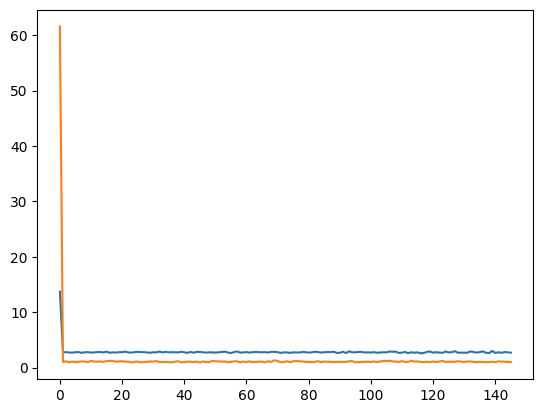

In [46]:
plt.plot(train_curve)
plt.plot(valid_curve)

In [47]:
iwvi.save(ckpt_key="policy_evaluation")

iwvi save ckpt1, ckpt2 ckpt_iwvi_basepartpendulum_policy_evaluation ckpt_iwvi_pendulum_policy_evaluation
base save ckpt ckpt_basevi_pendulum_policy_evaluation
base load self.initial_belief.data.sum() tensor(-7.0642)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(0.9056)


In [48]:
loss_array = np.array(loss_list)
print(loss_array)

[[-0.54832601 -0.35626011]
 [-0.95146182 -0.53466383]
 [-0.78411797 -0.43022522]
 [-0.68343913 -0.39976025]]


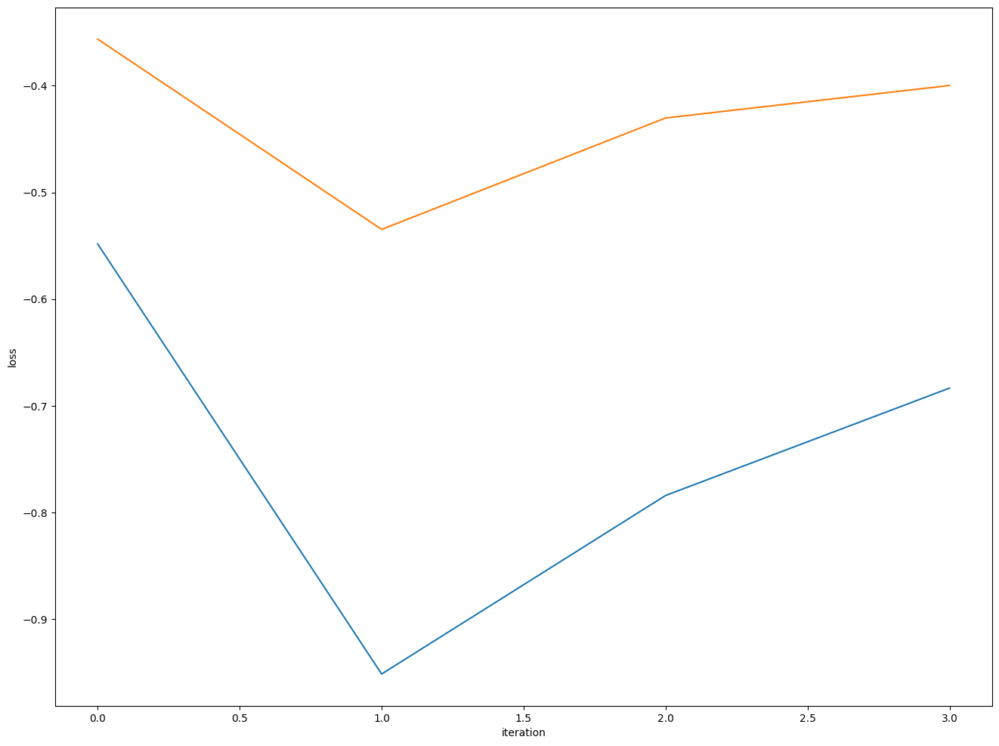

In [49]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.plot(loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve.png")
plt.savefig(figfilenamehead+"learning_curve.eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

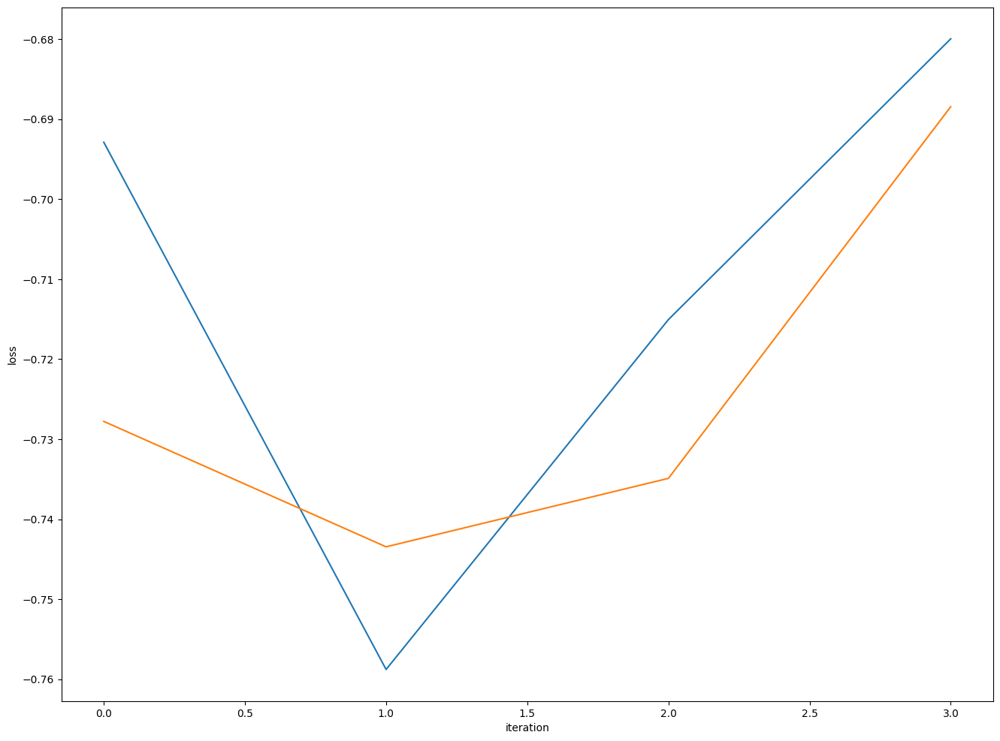

In [50]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.plot(normalized_loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".pdf")

In [51]:
print(iwvi.dec.state_dict()['net_phat.0.weight'].sum())

tensor(0.9056)
